# EDA TripAdvisor dataset

In this notebook you can find the EDA for sprint 1.

We will first start with loading the dataset and the required libraries.

In [3]:
# Import pandas and read csv using pandas
import pandas as pd
import seaborn as sn
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.transforms import Bbox
from random import shuffle
from sklearn.model_selection import train_test_split
original_df = pd.read_csv("./tripadvisor_dataset/restaurant_listings.csv")

# display the data and see how it formulated
pd.set_option("display.max_columns", None)
original_df.head(2)

,rank,restaurant name,general rating,number of reviews,tags,address,phone number,website url,menu url,timetable,email address,travelers choice,michelin,food rating,service rating,value rating,atmosphere rating,description,dutch description,price range,cuisines,special diets,meals,restaurant features,id
0,#1,Kin Khao - Thai Eatery,5.0 of 5 bubbles,922 reviews,$$ - $$$|Thai|Healthy|Vegetarian Friendly,"Donkersteeg 21-23, Ghent 9000 Belgium",+32 468 10 59 59,http://www.kinkhao.be/,http://www.kinkhao.be/site/menu/,True,gent@kinkhao.be,True,False,5.0,5.0,4.5,-1.0,"Differing from formal dining establishments, K...",NaN,€10 - €28,"Thai, Healthy","Vegetarian Friendly, Vegan Options, Gluten Fre...","Dinner, Drinks","Reservations, Seating, Serves Alcohol, Free Wi...",13969825
1,#1,'t Sleutelgat,5.0 of 5 bubbles,200 reviews,$$$$|French|Belgian|European,"Kasseide 78, Ninove 9400 Belgium",+32 54 56 63 09,http://www.restaurant-sleutelgat.be/,NaN,True,restaurant_sleutelgat@telenet.be,False,True,5.0,5.0,4.5,5.0,NaN,NaN,€32 - €74,"French, Belgian, European","Vegetarian Friendly, Vegan Options, Gluten Fre...","Lunch, Dinner","Free Wifi, Reservations, Outdoor Seating, Seat...",740727


## Splitting the data

The first thing we'll do is split the data in a test set and a trainings set. This is to avoid data snooping when we finally want to use ML

Before we split the data, let's look at a null heatmap.

In [4]:
import plotly.express as px
#pip install --upgrade nbformat

px.imshow(original_df.replace(-1,np.nan).isna(),title="Null Heatmap")


From this plot we can see that there are more null values in the bottom rows of the dataset than in the top, so for our analysis it is better to shuffle the data before we make a test-train split

In [5]:

df_train, df_test = train_test_split(original_df,test_size=0.2,train_size=0.8,shuffle=True)
print(df_train.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2064 entries, 2439 to 41
Data columns (total 25 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   rank                 1898 non-null   object 
 1   restaurant name      2064 non-null   object 
 2   general rating       2064 non-null   object 
 3   number of reviews    2064 non-null   object 
 4   tags                 1902 non-null   object 
 5   address              2064 non-null   object 
 6   phone number         1900 non-null   object 
 7   website url          1740 non-null   object 
 8   menu url             740 non-null    object 
 9   timetable            2064 non-null   bool   
 10  email address        1064 non-null   object 
 11  travelers choice     2064 non-null   bool   
 12  michelin             2064 non-null   bool   
 13  food rating          2064 non-null   float64
 14  service rating       2064 non-null   float64
 15  value rating         2064 non-null   

## Clean the data

we will start with numeric data, labeling each attribute with the correct type

In [6]:
print(df_train.info())
df_train.head(2)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2064 entries, 2439 to 41
Data columns (total 25 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   rank                 1898 non-null   object 
 1   restaurant name      2064 non-null   object 
 2   general rating       2064 non-null   object 
 3   number of reviews    2064 non-null   object 
 4   tags                 1902 non-null   object 
 5   address              2064 non-null   object 
 6   phone number         1900 non-null   object 
 7   website url          1740 non-null   object 
 8   menu url             740 non-null    object 
 9   timetable            2064 non-null   bool   
 10  email address        1064 non-null   object 
 11  travelers choice     2064 non-null   bool   
 12  michelin             2064 non-null   bool   
 13  food rating          2064 non-null   float64
 14  service rating       2064 non-null   float64
 15  value rating         2064 non-null   

,rank,restaurant name,general rating,number of reviews,tags,address,phone number,website url,menu url,timetable,email address,travelers choice,michelin,food rating,service rating,value rating,atmosphere rating,description,dutch description,price range,cuisines,special diets,meals,restaurant features,id
2439,NaN,de fritmarsjang,-1.0 of 5 bubbles,0 reviews,Belgian|European,"Ninovesteenweg 177, Erembodegem 9320 Belgium",NaN,https://www.de-fritmarsjang.be/,NaN,True,NaN,False,False,-1.0,-1.0,-1.0,-1.0,De Fritmarsjang: meer dan een gewone frituur! ...,NaN,No pricing available,"Belgian, European",NaN,"Lunch, Dinner, Drinks",NaN,23561091
514,#8,Casa Buscemi,4.0 of 5 bubbles,95 reviews,$$ - $$$|Italian|Mediterranean|European,"Stationsstraat 42 Ninove, Ninove 9400 Belgium",+32 478 80 11 00,http://www.casabuscemi.be/,http://www.casabuscemi.be/Menu.html,True,pinabuscemi@hotmail.com,False,False,3.5,4.0,3.5,4.0,NaN,"""Italiaans restaurant met siciliaanse speciali...",No pricing available,"Italian, European, Mediterranean","Gluten Free Options, Vegetarian Friendly","Dinner, Lunch","Reservations, Seating, Serves Alcohol, Table S...",3682528


we will start by turning rank, general rating, number of reviews to numerical values

In [7]:

df_train["rank"]=df_train["rank"].str.replace("#","").astype(float)
df_train["general rating"]=df_train["general rating"].map(lambda x: x.split(" ")[0]).astype(float)
df_train["number of reviews"]=df_train["number of reviews"].map(lambda x: x.split(" ")[0].replace(",","")).astype(float)

we can start by looking at the distributions of these numerical features

In [8]:
numerical_cols=df_train.select_dtypes(include= ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']).columns

In [9]:
#drop id because its not relevant for the plot
numerical_cols=numerical_cols.drop("id")
numerical_cols

Index(['rank', 'general rating', 'number of reviews', 'food rating',
       'service rating', 'value rating', 'atmosphere rating'],
      dtype='object')

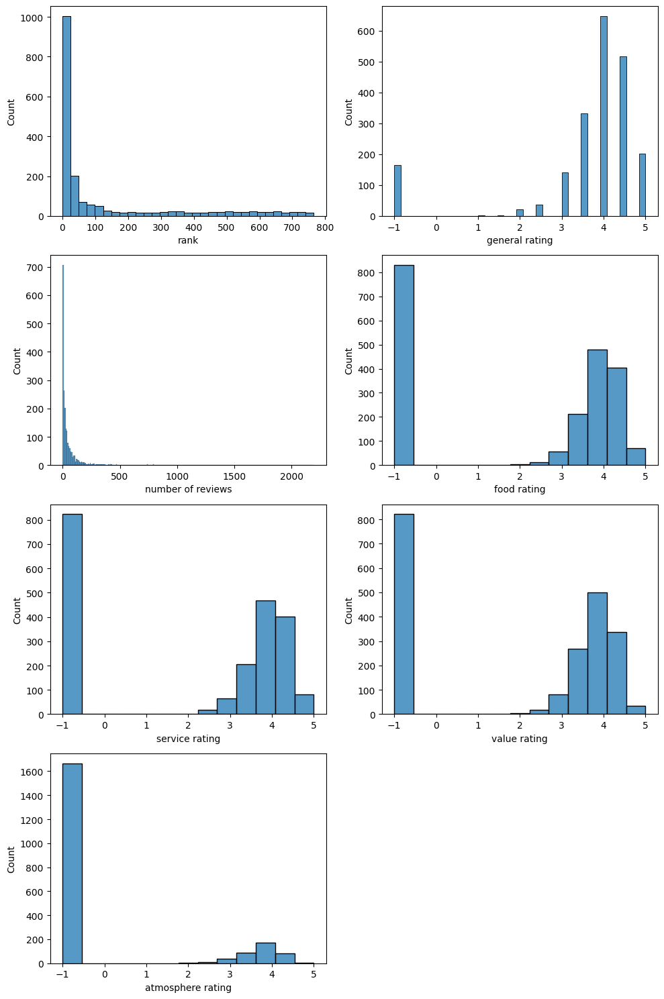

In [10]:
fig=plt.figure(figsize=(10,15))
for i, col in enumerate(numerical_cols):
    plt.subplot(4,2,i+1)
    sns.histplot(df_train[col])
fig.tight_layout()
plt.show()

what we can see from these distributions is:
* most restaurants have a low rank (lower is better)
* ratings with value -1 mean that they are missing data, there is a lot of missing data visible
* food rating, general rating , value rating and service rating seem to have the same distribution. Maybe they give us the same information and are redundant.

let's take a closer look at number of reviews

## number of reviews

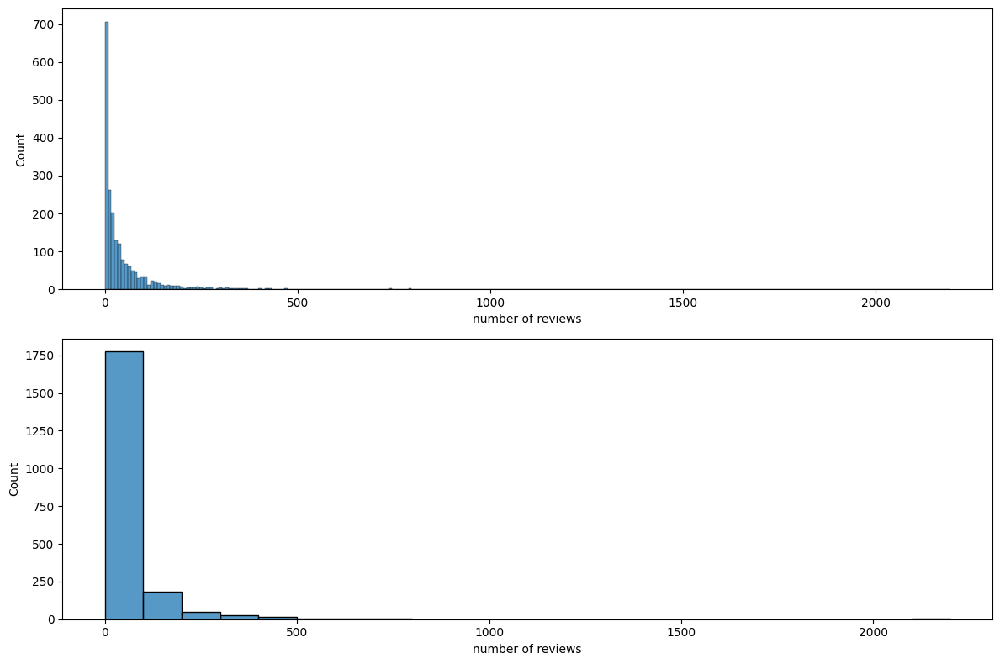

In [11]:
fig=plt.figure(figsize=(12,8))
plt.subplot(2,1,1)
sns.histplot(df_train["number of reviews"])
plt.subplot(2,1,2)
sns.histplot(df_train["number of reviews"],binwidth=100)
fig.tight_layout()
plt.show()


In [12]:
print(df_train["number of reviews"].value_counts().sort_index())
zeros=df_train["number of reviews"].isna().sum()
print(f"number of missing values is {zeros}")

0.0       164
1.0       113
2.0        93
3.0        78
4.0        71
         ... 
922.0       1
1484.0      1
1906.0      1
2140.0      1
2193.0      1
Name: number of reviews, Length: 272, dtype: int64
number of missing values is 0


There are a lot of restaurants with 0 reviews and no missing values. How many exactly?

In [13]:
perc_no_review=df_train["number of reviews"].value_counts()[0]/len(df_train)
print(f"{perc_no_review*100:.2f}% of the restaurants have no reviews!")


7.95% of the restaurants have no reviews!


We decide a treshhold for restaurants with low reviews = 4. So restaurants with 3 or less reviews we consider "hidden treasures"

In [14]:
perc_hidden=df_train["number of reviews"].value_counts()[0:3].sum()/len(df_train)
print(f"percentage of hidden treasures: {perc_hidden*100:.2f}%")

percentage of hidden treasures: 21.71%


are they really hidden treasures?
* what are the ratings of these hidden treasures? maybe they don't have many reviews bacause people don't eat there because the food is bad or maybe because of the location.
* is there a correlation between the location of a restaurant and the fact if its a hidden treasure or not? maybe there are clusters? maybe big cities don't have these "hidden treasures"

we will come back to this later, first we can start by extracting the city

In [15]:
df_train['city'] = df_train["address"].str.split(', ').str[-1].str.split(" ").str[0]

We wrote a script to get the coordinates for each restaurant in our dataset. That script will be included with our submission (see getCoordinated.ipynb) notebook. We saved the locations in a csv file with a format: (restaurantid,latitude,longitude)

## Hidden treasures
lets look at these hidden treasures in more detail (remember, hidden treasures are restaurants that have less than 4 ratings)

In [16]:
hidden_treasures=df_train[df_train["number of reviews"]<=3]
hidden_treasures.replace(-1,np.nan).isna().sum()

rank                   165
restaurant name          0
general rating         164
number of reviews        0
tags                   107
address                  0
phone number            75
website url            145
menu url               403
timetable                0
email address          246
travelers choice         0
michelin                 0
food rating            448
service rating         448
value rating           448
atmosphere rating      448
description            340
dutch description      394
price range              0
cuisines               116
special diets          447
meals                  253
restaurant features    398
id                       0
city                     0
dtype: int64

In [17]:
len(hidden_treasures)

448

we can see that all of the hidden treasures have no food/service/value-rating!
Also, a lot of them don't have a rank.

let's plot some graphs to see if we can get some more insights

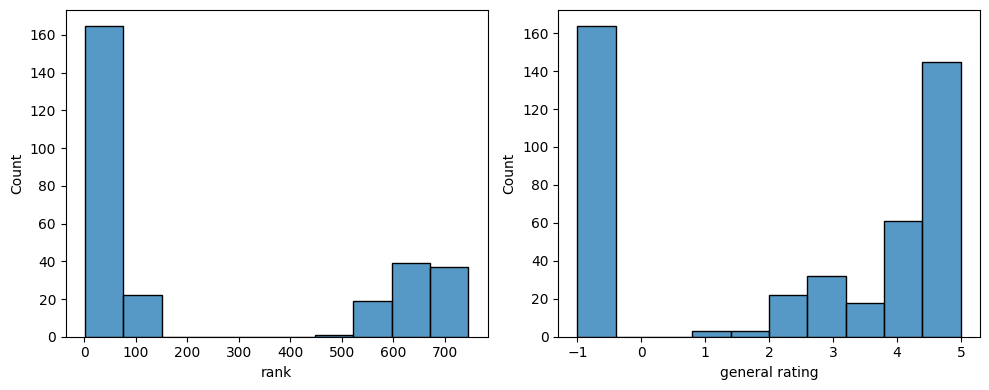

In [18]:
# cheap_restaurants_with_rating=cheap_restaurants.replace(-1,np.nan).dropna()
fig=plt.figure(figsize=(10,4))
plt.subplot(1,2,1)
sns.histplot(hidden_treasures["rank"])
plt.subplot(1,2,2)
sns.histplot(hidden_treasures["general rating"])
fig.tight_layout()
plt.show()

very interesting to see that there is a clear seperation! we have hidden treasures with ranks < 200 and with ranks >400. but no in between


maybe we can find out why by looking at their ratings

In [19]:
hidden_treasures_low_rank=hidden_treasures[hidden_treasures["rank"]<200]
hidden_treasures_high_rank=hidden_treasures[hidden_treasures["rank"]>400]
hidden_treasures_no_rank=hidden_treasures[hidden_treasures["rank"].isna()]
print(f"low: {len(hidden_treasures_low_rank)} high: {len(hidden_treasures_high_rank)} no={len(hidden_treasures_no_rank)}")
print("remember, lower rank is better!")

low: 187 high: 96 no=165
remember, lower rank is better!


let's look in detail at the hidden treasures with no ranking information

In [20]:
import plotly.express as px
#pip install --upgrade nbformat

px.imshow(hidden_treasures_no_rank.replace(-1,np.nan).isna(),title="Null Heatmap")


My god! they have no numerical information available at all
(╯°□°）╯︵ ┻━┻

<AxesSubplot:xlabel='general rating', ylabel='Count'>

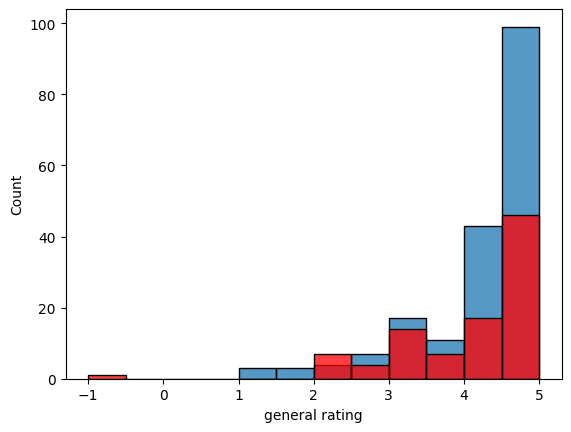

In [21]:
# hidden_treasures_low_rank["general rating"].value_counts().plot.bar()
# hidden_treasures_high_rank["general rating"].value_counts().plot.bar()
sns.histplot(binwidth=0.5,
            x="general rating",
            data=hidden_treasures_low_rank,
            stat="count",legend=True)
sns.histplot(binwidth=0.5,
            x="general rating",
            data=hidden_treasures_high_rank,
            color="red",
            stat="count",legend=True)

In [22]:
print(hidden_treasures_low_rank["general rating"].describe())
hidden_treasures_high_rank["general rating"].describe()


count    187.000000
mean       4.114973
std        0.938364
min        1.000000
25%        4.000000
50%        4.500000
75%        5.000000
max        5.000000
Name: general rating, dtype: float64


count    96.000000
mean      3.963542
std       1.091220
min      -1.000000
25%       3.000000
50%       4.000000
75%       5.000000
max       5.000000
Name: general rating, dtype: float64

on average there is not much difference in general rating between the high ranking and the low ranking hidden treasures, a lower ranking hidden treasure has on average a rating that's a little bit better than a high ranking hidden treasure

let's try to plot them on the map to see why they might have so few reviews

In [23]:
coords=pd.read_csv("coordinaten2.csv").replace(0,np.nan)
hidden_treasures_low_rank=hidden_treasures_low_rank.merge(coords,on="id")
hidden_treasures_high_rank=hidden_treasures_high_rank.merge(coords,on="id")
hidden_treasures_no_rank=hidden_treasures_no_rank.merge(coords,on="id")

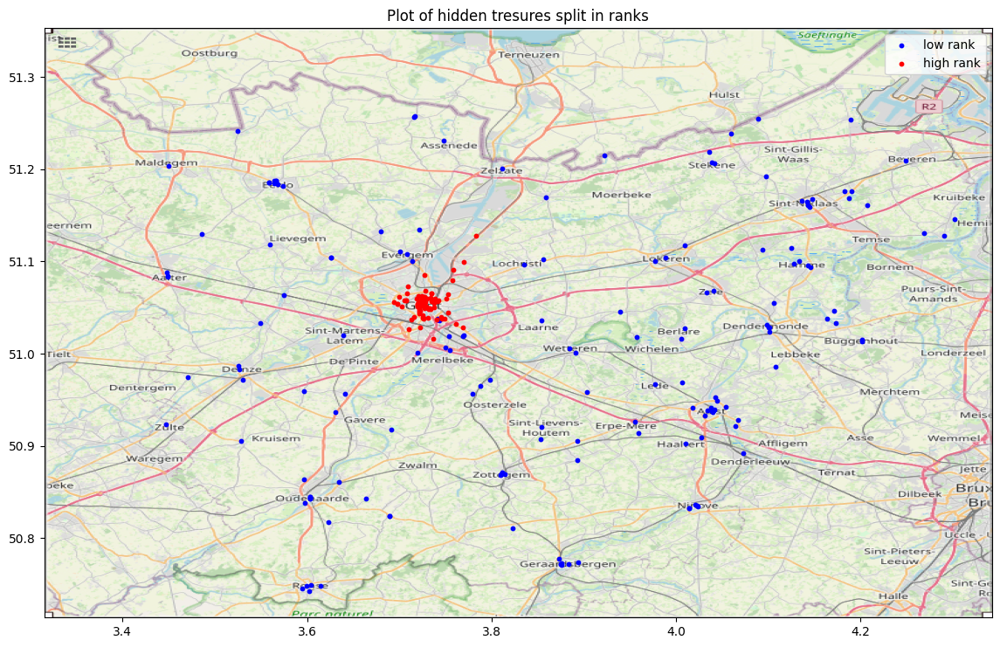

In [24]:
Bbox = (3.3151,4.3423,50.7139,51.3529)
map = plt.imread("east_flanders.png")

figure, ax = plt.subplots(figsize = (14,16))

ax.scatter(hidden_treasures_low_rank.longitude, hidden_treasures_low_rank.latitude, zorder=1, alpha= 1, c='b',s=10)
ax.scatter(hidden_treasures_high_rank.longitude, hidden_treasures_high_rank.latitude, zorder=1, alpha= 1, c='r',s=10,)

ax.set_title('Plot of hidden tresures split in ranks')
ax.set_xlim(Bbox[0],Bbox[1])
ax.set_ylim(Bbox[2],Bbox[3])
ax.legend(["low rank","high rank","no rank"])
ax.imshow(map, zorder=0, extent=Bbox, aspect='equal')

We can clearly see that the hidden treasures with high ranks are spread out over East-Flanders. If I find a restaurant with a low amount of reviews (hidden treasure) and it has a high rank, then the propability is very high that it is located in or near Ghent.


But that still didn't anwser our question, why do these restaurants have low reviews? And is the location the only factor that influences their ranking?

We were curious about how this ranking system works so we looked up some stuff online [The Secret to Improving Your Tripadvisor Ranking](https://www.checkfront.com/blog/improve-your-tripadvisor-ranking-with-this-one-simple-tip/#:~:text=Tripadvisor%27s%20ranking%20algorithm%20looks%20at,consistency%20of%20incoming%20positive%20reviews.)

here we found that your ranking as based on:
* the quantity of your reviews
* the recency of your reviews
* the quality of your reviews

so for these hidden treasures we already know, the quantity of our reviews is low. So the most obvious thing to look at next was if there was a big difference in their review quality.

In [25]:
reviews=pd.read_csv("./tripadvisor_dataset/reviews.csv")
reviews.head(2)

,id,reviewer name,title,date,rating,review
0,13969825,bertd818,supper snelle en lekkere lunch,"September 26, 2022",5.0,"supper lekker gegeten tijdens de middag, als w..."
1,13969825,593laetitiad,Un délicieux repas aux saveurs de la Thaïlande,"September 24, 2022",5.0,Un menu lunch très bien équilibré aux niveaux ...


let's extract the year from these reviews and then join them together with the other dataframes

In [26]:
reviews["review_year"]=reviews.date.str.split(" ").str[-1].astype(int)

In [27]:
hidden_treasures_low_rank=hidden_treasures_low_rank.merge(reviews,on="id")
hidden_treasures_high_rank=hidden_treasures_high_rank.merge(reviews,on="id")


<AxesSubplot:xlabel='rating', ylabel='Count'>

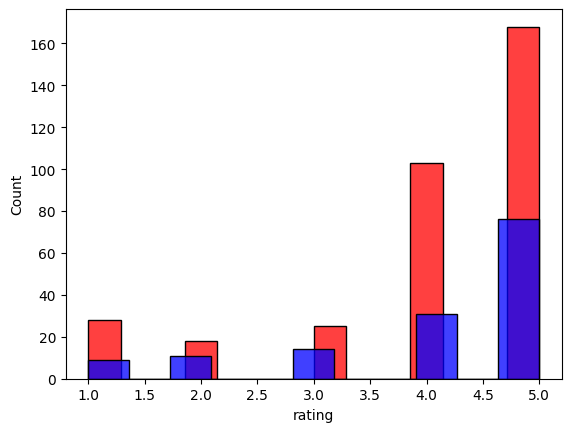

In [28]:
sns.histplot(hidden_treasures_low_rank.rating,color="red")
sns.histplot(hidden_treasures_high_rank.rating,color="blue")

In [29]:
print(hidden_treasures_low_rank.rating.mean())
print(hidden_treasures_high_rank.rating.mean())

4.067251461988304
4.092198581560283


I don't really see a difference between the review-ratings, so the difference in their ranks must be caused by something else. Let's dig a little bit deeper

2019.9883040935672
2019.177304964539


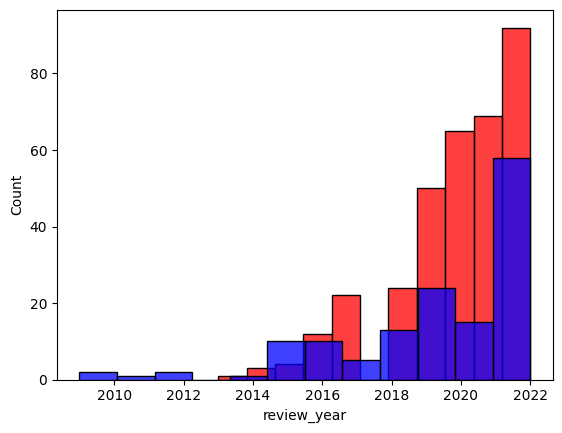

In [30]:
sns.histplot(hidden_treasures_low_rank["review_year"],color="red")
sns.histplot(hidden_treasures_high_rank["review_year"],color="blue")
print(hidden_treasures_low_rank["review_year"].mean())
print(hidden_treasures_high_rank["review_year"].mean())

I officially give up. I admit my defeat 😢, I can't seem to find why these restaurants have so little reviews. I did find out that in these hidden treasures we can seperate 2 groups, those with a high rank, those with a low rank (and those with no ranking information). We also found out that one of the causes of this ranking difference is the location. 

If your restaurant is located in a big city and you have not many reviews then you're actually performing worse than a restaurant that has the same amount of reviews but is located in a random neighborhood. That might be the cause of the ranking difference. So atleast we did find out this interesting fact from all of these plots :) 

So if we look back at [The Secret to Improving Your Tripadvisor Ranking](https://www.checkfront.com/blog/improve-your-tripadvisor-ranking-with-this-one-simple-tip/#:~:text=Tripadvisor%27s%20ranking%20algorithm%20looks%20at,consistency%20of%20incoming%20positive%20reviews.). Through our data analysis we discovered that this is not completely true, it also depends on your location.

## Price Range
now we can also look at the price range

In [31]:
df_train["price range"]

2439    No pricing available
514     No pricing available
1974    No pricing available
1104               €10 - €40
2240    No pricing available
                ...         
617     No pricing available
887     No pricing available
508     No pricing available
258                €14 - €38
41                 €20 - €50
Name: price range, Length: 2064, dtype: object

we can split this up into upper_price and lowr_price if it's available

In [32]:
temp=df_train["price range"].str.replace("No pricing available","nan - nan").str.replace("€","").str.split("-",expand=True).rename(columns={0:"lower price",1:"upper price"})
df_train["lower_price"]=temp["lower price"].astype(float)
df_train["upper_price"]=temp["upper price"].astype(float)
df_train.drop(columns=["price range"],inplace=True)


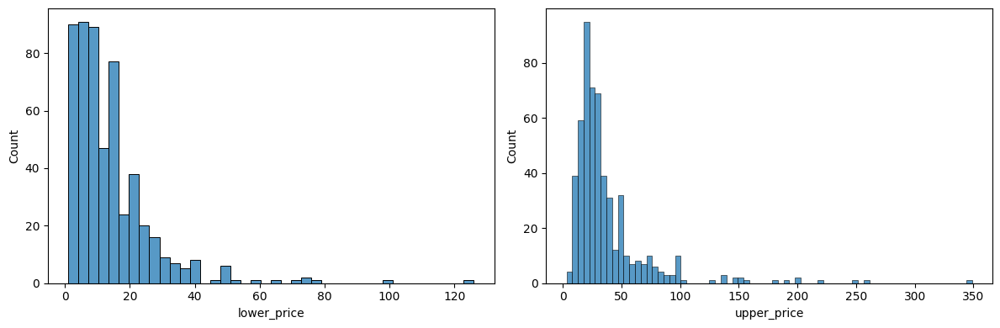

In [33]:
fig=plt.figure(figsize=(12,4))
plt.subplot(1,2,1)
sns.histplot(df_train["lower_price"])
plt.subplot(1,2,2)
sns.histplot(df_train["upper_price"])
fig.tight_layout()
plt.show()


as we can see there are restaureants who have minimum prices of €100 and upper prices of more than €400, lets check if that's not a typo

In [34]:
high_upper=df_train[df_train["upper_price"]>150]
high_upper[["restaurant name","rank","general rating","number of reviews","michelin","food rating","service rating","value rating","atmosphere rating","lower_price", "upper_price","meals"]]

,restaurant name,rank,general rating,number of reviews,michelin,food rating,service rating,value rating,atmosphere rating,lower_price,upper_price,meals
30,Gillis,19.0,4.5,428.0,False,4.5,4.5,4.0,4.5,60.0,200.0,Dinner
22,Portobelfino,2.0,4.5,400.0,False,4.5,4.5,4.5,4.5,100.0,250.0,"Lunch, Dinner, Late Night"
14,Hof van Cleve,1.0,5.0,472.0,True,5.0,5.0,4.5,4.5,126.0,260.0,"Lunch, Dinner, Late Night"
1344,iGent,496.0,4.5,18.0,False,1.0,1.5,1.5,1.0,1.0,200.0,"Lunch, Dinner"
1268,K27,478.0,4.5,11.0,False,-1.0,-1.0,-1.0,-1.0,2.0,349.0,Drinks
737,Restaurant Jan Van den Bon,305.0,3.5,112.0,True,4.0,3.5,3.0,3.0,73.0,220.0,"Lunch, Dinner"
533,Ter schroeven,5.0,4.5,61.0,False,4.5,4.5,4.5,4.5,71.0,190.0,"Lunch, Dinner, Late Night"
2158,Keysershof,2.0,3.0,97.0,False,3.5,3.5,3.0,3.5,39.0,158.0,"Lunch, Dinner"
982,Asian King,389.0,4.0,33.0,False,4.0,4.0,4.0,-1.0,4.0,180.0,"Lunch, Dinner"


from the restaurants who have high upper prices:
* there is 1 with a michelin star
* on average they have a general rating >=4
* the lower price is exteremely low! maybe because they include drinks in their lower price
* we conclude that rank is only partly affected by rating. The restaurant Amatsu has a michelin star, which means the food, service,... is excellent but it's rank is only 272. Average people don't go to michelin starred restaurant very often so that is maybe the cause of the lower rank.
* the data is a little messed up. iGent has an upper price of €200. as students of Ghent University we can testify that that is incorrect

from this we can conclude that we have to look at these price ranges with a grain of salt. because not all of them are correct/sometimes drinks are included


<span style="color:red">notice because of the shuffeling of our data before the train, test-split the examples of restaurants mention in our conclusions might not be visible in the dataframe </span>

## cheap_restaurants

let's analyze the cheap restaurants, we defined cheap as upper_price<=30

In [35]:
cheap_restaurants=df_train[df_train["upper_price"]<=30]
cheap_restaurants=cheap_restaurants[["restaurant name","rank","general rating","number of reviews","michelin","food rating","service rating","value rating","atmosphere rating","lower_price", "upper_price","meals","city","id"]]

<__array_function__ internals>:180: RuntimeWarning:

Converting input from bool to <class 'numpy.uint8'> for compatibility.



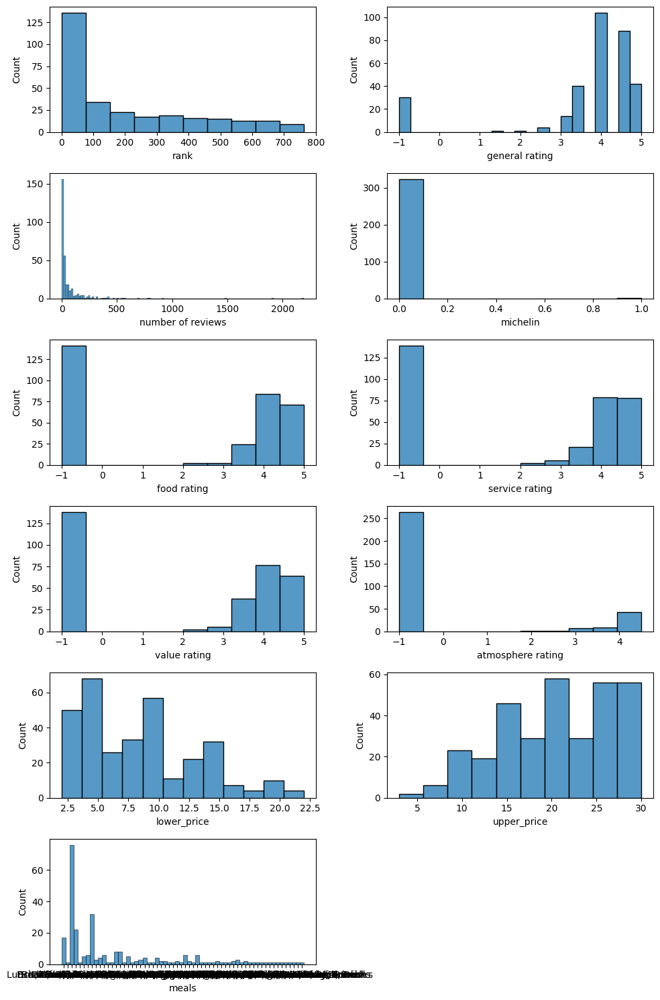

In [36]:
fig=plt.figure(figsize=(10,15))
for i, col in enumerate(["rank","general rating","number of reviews","michelin","food rating","service rating","value rating","atmosphere rating","lower_price", "upper_price","meals"]):
    plt.subplot(6,2,i+1)
    sns.histplot(cheap_restaurants[col])
fig.tight_layout()
plt.show()

* we can see that a lot of cheap restaurants have a low rank (which is good)
* we can see a very clear peak in the meals chart, lets take a closer look


In [37]:
cheap_restaurants.meals.value_counts()
meals=cheap_restaurants.meals.str.split(",",expand=True)
pd.concat((meals[0],meals[1],meals[2],meals[3],meals[4])).str.strip().value_counts()

Dinner        226
Lunch         223
Drinks        107
Breakfast      51
Brunch         50
Late Night     21
dtype: int64

From all the cheap restaurants, most types of meals offered is Lunch, which is expected. 
But it's also interesting to note most of the cheap restaurants also serve Dinner and Drinks.


A lot of the ratings are -1, lets look at the cheap restaurants without these contaminations

<__array_function__ internals>:180: RuntimeWarning:

Converting input from bool to <class 'numpy.uint8'> for compatibility.



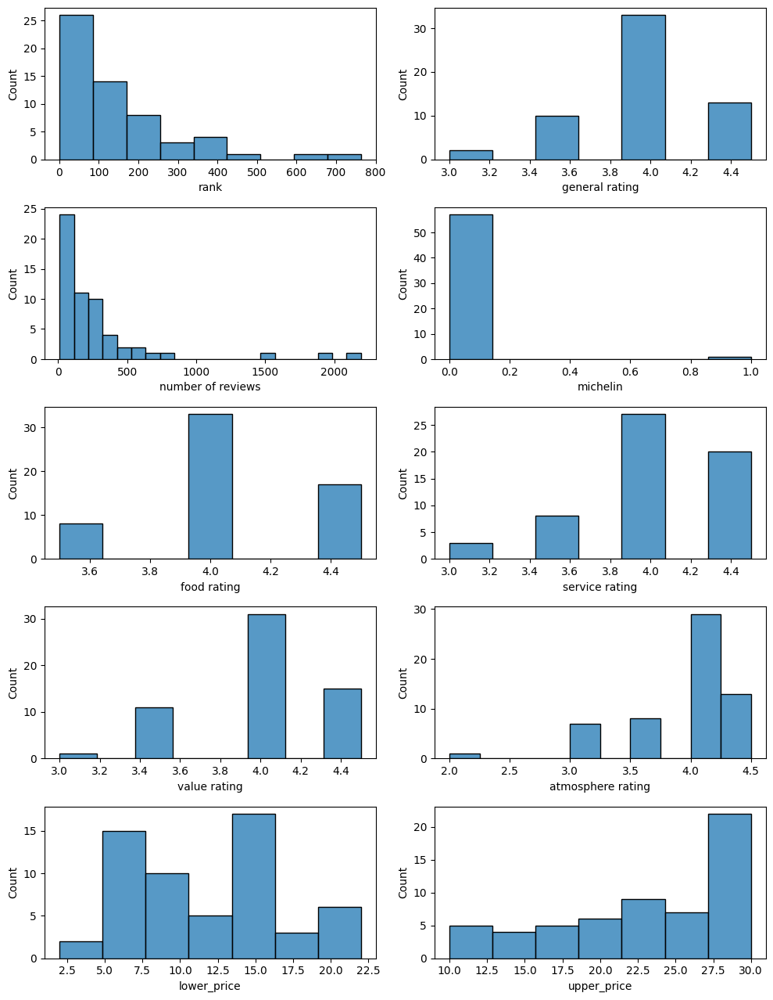

In [38]:
cheap_restaurants_with_rating=cheap_restaurants.replace(-1,np.nan).dropna()
fig=plt.figure(figsize=(10,15))
for i, col in enumerate(["rank","general rating","number of reviews","michelin","food rating","service rating","value rating","atmosphere rating","lower_price", "upper_price"]):
    plt.subplot(6,2,i+1)
    sns.histplot(cheap_restaurants_with_rating[col])
fig.tight_layout()
plt.show()

* general-, food-,service- and value rating have the same distribution. from this we suspect that these values have high correlations. If one of my ratings is good, the others are very close to it. we could then drop the reduntant features.

* some of the cheap restaurants have more than a thousand reviews! I have to take a closer look at those. Maybe I can find their secret


In [39]:
cheap_restaurants[cheap_restaurants["number of reviews"]>1000]

,restaurant name,rank,general rating,number of reviews,michelin,food rating,service rating,value rating,atmosphere rating,lower_price,upper_price,meals,city,id
98,Restaurant De Graslei,58.0,4.0,1484.0,False,4.0,4.0,4.0,4.5,18.0,30.0,"Lunch, Dinner, Brunch",Ghent,1058490
148,Amadeus Ghent 1,84.0,4.0,1906.0,False,4.0,4.0,4.0,4.0,12.0,20.0,"Lunch, Dinner, Late Night",Ghent,740683
27,Du Progres,16.0,4.5,2193.0,False,4.5,4.5,4.5,4.0,22.0,29.0,"Lunch, Dinner, Brunch, Late Night",Ghent,814598


All of these are located in ghent! that explains the high amount of reviews. But the others, are they not located in ghent? Let's check

In [40]:
cheap_restaurants=cheap_restaurants.merge(coords,on="id")

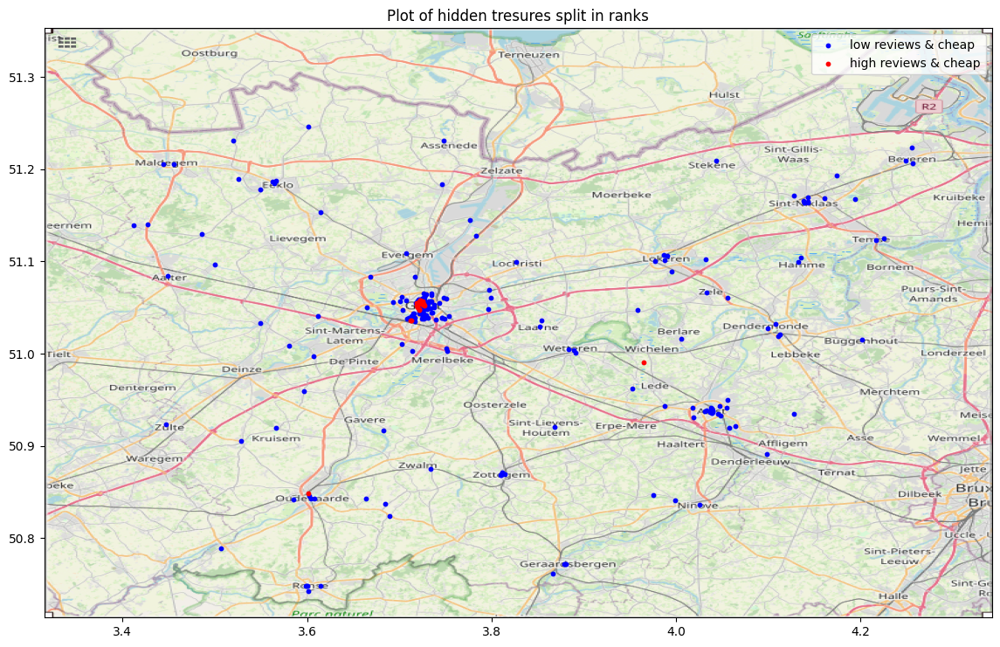

In [41]:
Bbox = (3.3151,4.3423,50.7139,51.3529)
map = plt.imread("east_flanders.png")

figure, ax = plt.subplots(figsize = (14,16))
low_reviews=cheap_restaurants[cheap_restaurants["number of reviews"]<200]
high_reviews=cheap_restaurants[cheap_restaurants["number of reviews"]>=200]

ax.scatter(low_reviews.longitude, low_reviews.latitude, zorder=1, alpha= 1, c='b',s=10)
ax.scatter(high_reviews.longitude, high_reviews.latitude, zorder=1, alpha= 1, c='r',s=10,)

ax.set_title('Plot of hidden tresures split in ranks')
ax.set_xlim(Bbox[0],Bbox[1])
ax.set_ylim(Bbox[2],Bbox[3])
ax.legend(["low reviews & cheap","high reviews & cheap"])
ax.imshow(map, zorder=0, extent=Bbox, aspect='equal')

I changed the treshold from 1000 to 200 and still,... almost all of the restaurants with high number of reviews are located in bigger cities like ghent or aalst. So that's their secret ;)

## general-, food-,service- and value rating

we already know that these attributes have the same distribution, lets see if they are redundant

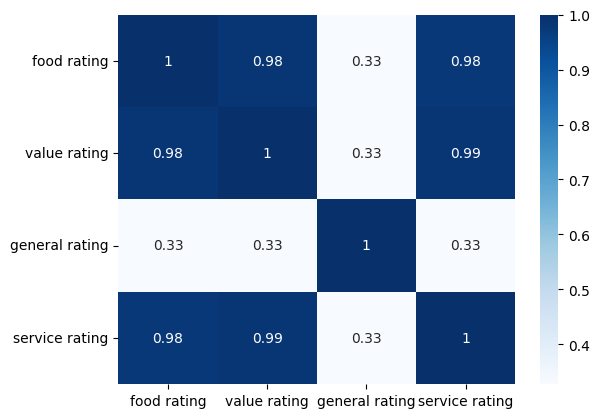

In [42]:
corr = df_train[["food rating","value rating","general rating","service rating"]].corr()
heatmap = sns.heatmap(corr, annot=True, cmap="Blues")

Okay, we should have done this earlier😅. Food rating, value rating and service rating have a correlation factor of 0.98. which means that if we know 1 of them, the other ratings won't give us any more interesting information so we can safely drop them.

In [43]:
df_train.drop(columns=["food rating", "service rating"], inplace=True)

In [44]:
df_train

,rank,restaurant name,general rating,number of reviews,tags,address,phone number,website url,menu url,timetable,email address,travelers choice,michelin,value rating,atmosphere rating,description,dutch description,cuisines,special diets,meals,restaurant features,id,city,lower_price,upper_price
2439,NaN,de fritmarsjang,-1.0,0.0,Belgian|European,"Ninovesteenweg 177, Erembodegem 9320 Belgium",NaN,https://www.de-fritmarsjang.be/,NaN,True,NaN,False,False,-1.0,-1.0,De Fritmarsjang: meer dan een gewone frituur! ...,NaN,"Belgian, European",NaN,"Lunch, Dinner, Drinks",NaN,23561091,Erembodegem,NaN,NaN
514,8.0,Casa Buscemi,4.0,95.0,$$ - $$$|Italian|Mediterranean|European,"Stationsstraat 42 Ninove, Ninove 9400 Belgium",+32 478 80 11 00,http://www.casabuscemi.be/,http://www.casabuscemi.be/Menu.html,True,pinabuscemi@hotmail.com,False,False,3.5,4.0,NaN,"""Italiaans restaurant met siciliaanse speciali...","Italian, European, Mediterranean","Gluten Free Options, Vegetarian Friendly","Dinner, Lunch","Reservations, Seating, Serves Alcohol, Table S...",3682528,Ninove,NaN,NaN
1974,13.0,Chaplin,5.0,1.0,NaN,"Grote Baan 240, Lovendegem 9920 Belgium",+32 9 224 23 08,http://www.broodjesgent.be/,NaN,True,chaplin.gent@gmail.com,False,False,-1.0,-1.0,NaN,NaN,NaN,NaN,"Breakfast, Lunch, Dinner",NaN,18184636,Lovendegem,NaN,NaN
1104,15.0,Bistro3,4.5,7.0,$$ - $$$|French|Belgian|European,"Edeschoolstraat 3, Wetteren 9230 Belgium",+(32)3114606,http://www.bistro3.be/,https://www.bistro-3.be/#Onsafhaalmenu,True,bistro3tenede@gmail.com,False,False,-1.0,-1.0,"Bistro 3, A Cozy Bistro Where Everyone Is Welc...",Brasserie met vers bereide seizoensgebonden ge...,"French, Belgian, European",NaN,"Lunch, Dinner, Drinks","Takeout, Reservations, Outdoor Seating, Seatin...",21816822,Wetteren,10.0,40.0
2240,43.0,d'Afspanning,3.0,45.0,$$ - $$$|Belgian|Dutch|European,"Edingsesteenweg 421, Ninove 9400 Belgium",+32 54 50 05 99,http://www.dafspanning.be/,NaN,False,NaN,False,False,3.0,-1.0,NaN,NaN,"Belgian, European, Dutch",NaN,Dinner,"Reservations, Seating, Table Service",4115358,Ninove,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
617,6.0,Kasteel Van Saffelaere,4.5,44.0,$$ - $$$|French|Belgian|European,"Kerkstraat 37 Zaffelare, Lochristi 9080 Belgium",+32 9 355 11 50,http://www.kasteelvansaffelaere.com/,NaN,True,info@kasteelvansaffelaere.com,False,False,4.5,-1.0,NaN,NaN,"French, Belgian, European",Vegetarian Friendly,"Dinner, Lunch","Reservations, Serves Alcohol, Table Service, S...",7809791,Lochristi,NaN,NaN
887,17.0,China Paleis,4.0,33.0,$$ - $$$|Chinese|Asian|Vegetarian Friendly,"Markt 10, Geraardsbergen 9500 Belgium",+32 54 43 86 68,http://www.chinapaleis.be/,NaN,False,xiaowei.chen@skynet.be,False,False,4.5,-1.0,NaN,NaN,"Chinese, Asian",Vegetarian Friendly,"Lunch, Dinner","Takeout, Reservations, Seating, Wheelchair Acc...",3651739,Geraardsbergen,NaN,NaN
508,4.0,De Baronie,4.0,66.0,$$ - $$$|French|Belgian|European,"Vaartstraat 36, Lovendegem 9920 Belgium",+32 9 372 69 83,http://www.de-baronie.be/,NaN,True,info@de-baronie.be,False,False,4.0,3.5,NaN,NaN,"European, French, Belgian",Vegetarian Friendly,"Dinner, Lunch","Reservations, Wheelchair Accessible, Serves Al...",3488339,Lovendegem,NaN,NaN
258,13.0,Cafe de Paris,4.0,186.0,$$ - $$$|Belgian|European|Vegetarian Friendly,"Grote Markt 7, Aalst 9300 Belgium",+32 53 78 45 29,http://www.cafe-de-paris-aalst.be/,https://www.cafe-de-paris-aalst.be/#menu,True,NaN,False,False,4.0,-1.0,NaN,NaN,"Belgian, European",Vegetarian Friendly,"Lunch, Dinner","Reservations, Outdoor Seating, Seating, Serves...",7963960,Aalst,14.0,38.0


## Correlation between rank and restaurant type?

In the next cell we try to find a correlation between the popularity of a restaurant and the type of restaurant. For example: are Chinese restaurants the most popular? We find this out by using the average rank as popularity measure and the tags as restaurant type.

In [45]:
df_train_tags_cleaned = df_train.copy()

# splitting all the tags
df_train_tags_cleaned["tags"] = df_train_tags_cleaned["tags"].str.split("|")

# converting every tag into a new column
df_train_tags_cleaned = df_train_tags_cleaned.explode('tags').reset_index(drop=True)

# drop all tags with $ in
df_train_tags_cleaned = df_train_tags_cleaned.groupby("tags").filter(lambda x : str(x).count("$") == 0)

# make a copy for in a later stage
df_train_tags_cleaned_copy = df_train_tags_cleaned.copy()

# keep the rank and tags column
df_train_tags_cleaned = df_train_tags_cleaned[["rank", "tags"]]



# group by tag and take the mean of all the ranks
df_train_tags_cleaned_sum = df_train_tags_cleaned.groupby("tags").count()
df_train_tags_cleaned = df_train_tags_cleaned.groupby("tags").mean()
df_train_tags_cleaned["amount of restaurants"] = df_train_tags_cleaned_sum["rank"]
df_train_tags_cleaned["rank"] = df_train_tags_cleaned["rank"].round()
df_train_tags_cleaned = df_train_tags_cleaned.dropna()
df_train_tags_cleaned = df_train_tags_cleaned.sort_values(by=["amount of restaurants", "rank"], ascending=[False, True]) # sorting
df_train_tags_cleaned


,rank,amount of restaurants
tags,,
Belgian,90.0,1022
European,99.0,978
Vegetarian Friendly,117.0,297
French,66.0,248
Dutch,62.0,204
...,...,...
Afghan,354.0,1
Filipino,366.0,1
Central American,406.0,1


In the table above we can see which restaurant type is the most popular. It might be interesting to start a restaurant with one of the top ranked types to have a good rank.

## Where to open my restaurant?

If you know what type of restaurant you want to open, a very important decision is to choose where to open your restaurant.
We want to know the following questions:

* Which city is has the highest average ranked restaurants?
* How many type restaurants are there in every city? (for example how many Chinese restaurants in Gent, Sint-Niklaas, ...)

The answer on the following questions can give insight on the location of the restaurant.

In the following cell we answer the first question, even though it's not sorted on the average rank. You firstly see the cities with one restaurant and a low (good) ranking. This doesn't tell much, this is why we sort first on the amount of restaurants.

In [46]:
df_train_city = df_train[["city", "rank"]]

count = df_train_city.groupby("city").count()

df_train_city = df_train_city.dropna()
df_train_city = df_train_city.groupby("city").mean()
df_train_city["amount of restaurants"] = count
df_train_city = df_train_city.sort_values(by=["amount of restaurants", "rank"], ascending=[False, True])


df_train_city


,rank,amount of restaurants
city,,
Ghent,383.333333,609
Aalst,68.009615,104
Sint-Niklaas,54.418605,86
Dendermonde,30.510204,49
Oudenaarde,27.090909,44
...,...,...
Ophasselt,2.000000,1
Schorisse,2.000000,1
Steenhuize,2.000000,1


In the next cell we answer the second question. For every restaurant type you can see how many there are in each city (if the city is not mentioned it means 0)

In [47]:
df_train_city_type = df_train_tags_cleaned_copy[["city", "tags"]]
df_train_city_type = df_train_city_type.groupby(["tags", "city"])["city"].count().to_frame()
df_train_city_type = df_train_city_type.rename(columns={"city": "city_count"})


df_train_city_type

# Find how many Chinese restaurants there are. The cities that are missing means that there aren't any there
# df_train_city_type.loc["Chinese"]


city_count
tags       city                      
Afghan     Aalst                    1
           Geraardsbergen           2
           Ghent                    1
African    Eeklo                    1
           Ghent                    1
...                               ...
Vietnamese Steendorp                1
Wine Bar   Ghent                    5
           Lokeren                  1
           Oudenaarde               1
           Temse                    1

[1185 rows x 1 columns]

To find out how many restaurants there are for a specific cuisine. You can see where there is an ambundance of Chinese restaurants, that's not where you want to open one.
```py 
df_train_city_type.loc["Chinese"]
```

## Atmosphere clustering
Next we want to see if there are clusters formed of restaurants with a high atmosphere rating. To start we plot every restaurant on the map.

In [48]:
coords = pd.read_csv("coordinaten2.csv")

df_train_coords = df_train.merge(coords,on="id")

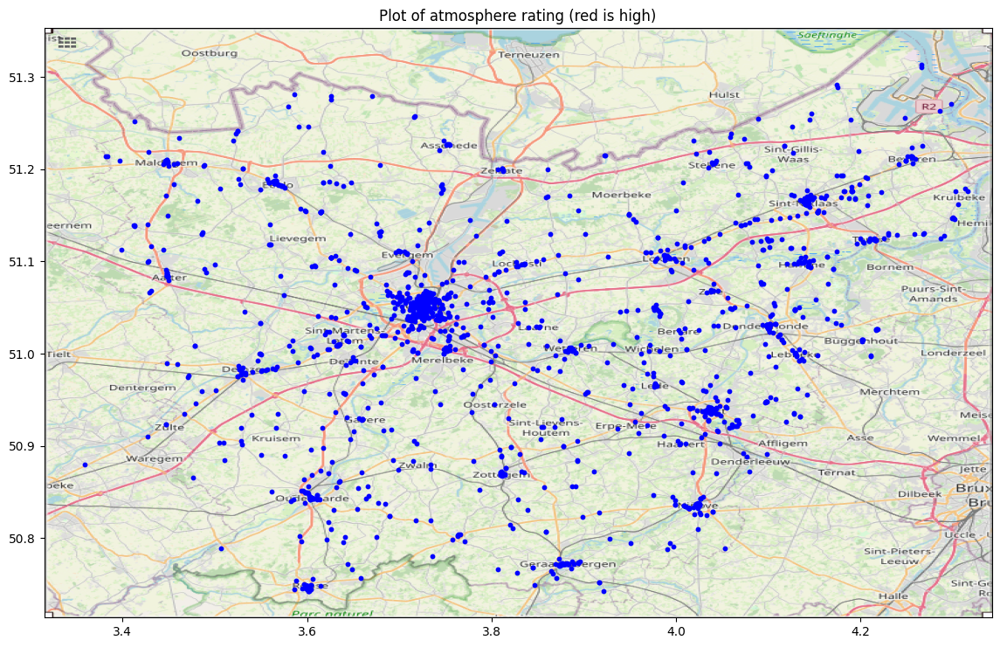

In [49]:
Bbox = (3.3151,4.3423,50.7139,51.3529)
map = plt.imread("east_flanders.png")

figure, ax = plt.subplots(figsize = (14,16))

ax.scatter(df_train_coords.longitude, df_train_coords.latitude, zorder=1, alpha= 1, c='b',s=10)

ax.set_title('Plot of atmosphere rating (red is high)')
ax.set_xlim(Bbox[0],Bbox[1])
ax.set_ylim(Bbox[2],Bbox[3])

ax.imshow(map, zorder=0, extent=Bbox, aspect='equal')

To see if there is clustering, we map all the restaurants with a rating higher than 4.5 in red, everything lower in blue. Restaurants without an atmosphere rating (-1) are dropped.

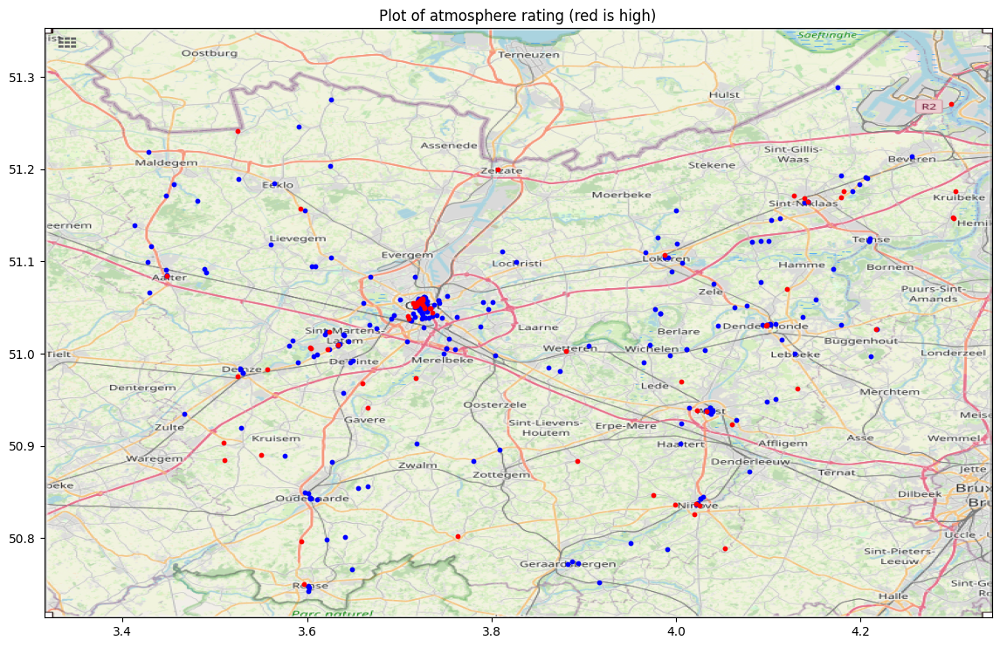

In [50]:
df_train_coords = df_train_coords.replace(-1, np.nan)

df_train_coords_low = df_train_coords[df_train_coords["atmosphere rating"] < 4.5]
df_train_coords_high = df_train_coords[df_train_coords["atmosphere rating"] >= 4.5]

Bbox = (3.3151,4.3423,50.7139,51.3529)
map = plt.imread("east_flanders.png")

figure, ax = plt.subplots(figsize = (14,16))

ax.scatter(df_train_coords_low.longitude, df_train_coords_low.latitude, zorder=1, alpha= 1, c='b',s=10)
ax.scatter(df_train_coords_high.longitude, df_train_coords_high.latitude, zorder=1, alpha= 1, c='r',s=10)

ax.set_title('Plot of atmosphere rating (red is high)')
ax.set_xlim(Bbox[0],Bbox[1])
ax.set_ylim(Bbox[2],Bbox[3])

ax.imshow(map, zorder=0, extent=Bbox, aspect='equal')


You can see that there are two clusters: Gent and Sint-Niklaas. Those places might have a pleasant ambience and can be a good place to locate a new restaurant.

## Restaurant features

When you start a new restaurant, you certainly don't want to offer less features than other restaurants. It can be handy to know which restaurant features there are available, but also which ones are not frequently offered. That's maybe where you can offer more.

In the next cell we make a table with the occurence the mentioned restaurant features.

In [51]:
df_train_copy = df_train.copy()
df_train_copy["restaurant features"] = df_train_copy["restaurant features"].str.split(",")
df_train_copy = df_train_copy.filter(["restaurant features", "rank"])

df_train_features_exploded = df_train_copy.explode('restaurant features').reset_index(drop=True)
df_train_features_exploded["restaurant features"] = df_train_features_exploded["restaurant features"].str.strip().str.lower()
df_train_features_exploded = df_train_features_exploded.dropna()

df_train_features_exploded = df_train_features_exploded.groupby("restaurant features").count()
df_train_features_exploded = df_train_features_exploded.rename(columns={"rank": "occurences"})
df_train_features_exploded = df_train_features_exploded.sort_values(by=["occurences"], ascending=False)

df_train_features_exploded


,occurences
restaurant features,
reservations,1256
seating,1236
table service,1204
serves alcohol,878
wheelchair accessible,719
outdoor seating,492
highchairs available,353
takeout,347
accepts credit cards,325


When we look at the top 10 restaurant features, we see some unexpected features like highchairs available, wheelchair accessible and takeout. These features are interesting to keep in mind when opening a restaurant.

## International popularity

Which restaurants have international reviews? Are international tourists more likely to eat in big cities or in small, local restaurants? To detect international reviews we made only a difference between languages that uses ASCII characters between 0-256. Anything higher we assume is international (such as Chinese, Arabic, ...)



In [52]:
def language_detector(text):
    """
    True means it's western language (English, Dutch, ...)
    False means it's an exotic language (Chinese, Arabic, ...)
    """
    text = str(text)
    west_count = 0
    exotic_count = 0
    for kar in text:
        ascii = ord(kar)
        if ascii > 256:
            exotic_count += 1
        else:
            west_count += 1
    
    return west_count > exotic_count

df_reviews = pd.read_csv("tripadvisor_dataset/reviews.csv")
df_reviews_train, df_reviews_test = train_test_split(df_reviews, test_size=0.2)

df_reviews_train["western"] = df_reviews_train["review"].apply(lambda x: language_detector(x))

df_reviews_train_false = df_reviews_train[df_reviews_train.western == False]
df_reviews_train_false


,id,reviewer name,title,date,rating,review,western
60840,6664445,anna_mariaza22,Πολύ καλή επιλογή,"May 24, 2017",4.0,Από τα καλύτερα burger στην Γάνδη.. Μεγάλες με...,False
69231,5308476,851ekaterinak,Паста и пицца,"October 12, 2015",5.0,"Вкусная паста, её много и дёшево.обслуживают б...",False
61001,6664445,Maxim S,Ресторан который стоит посетить,"May 1, 2016",4.0,"Ellis Gourmet в самом центре Гента, очень крас...",False
39661,4371274,nefnef2015,Υπεροχος χωρος!,"October 27, 2018",5.0,Ομορφο και ζεστο εστιατοριο! Μου αρεσε που ητα...,False
32775,1058490,golovach,Отличные морепродукты и пиво,"October 23, 2014",5.0,Ужинали в этом ресторане. Подчеркнул отличное ...,False
...,...,...,...,...,...,...,...
32443,1058490,hatsuden,ランチセットはリーズナブル、テラス席もGood！,"November 15, 2015",5.0,ツアー中の自由昼食で利用、ランチセットはリーズナブルです(前菜+メイン＝15、今回日曜だった...,False
44319,740683,ViewRight,太多了,"January 12, 2018",4.0,「每道菜都是一人份，不得分食！」這是服務生一直強調的，就連我說我點兩道主餐然後不續也沒用。但...,False
42780,796954,Yoshiaki,店内の雰囲気も抜群,"October 11, 2009",5.0,ホテルのレセプションで勧められたレストランです。現地の人も利用するところで、料理も店内の雰囲...,False
12005,814598,Rhinohorn_00,安くて美味しい,"September 21, 2014",5.0,ゲントの中心、広場に面してこれ以上無いロケーションにもかかわらず、客を喜ばせようと苦心してい...,False


In [53]:

df_reviews_train_false = df_reviews_train_false.groupby("id").count()

df_reviews_train_false = df_reviews_train_false.filter(["id", "date"])
df_reviews_train_false = df_reviews_train_false.rename(columns={"date": "occurences"})
df_reviews_train_false = df_reviews_train_false.sort_values(by=["occurences"], ascending=False)

df_reviews_train_false

,occurences
id,
740683,38
814598,38
796954,33
6578428,30
1058490,27
...,...
4734624,1
4942460,1
4959577,1


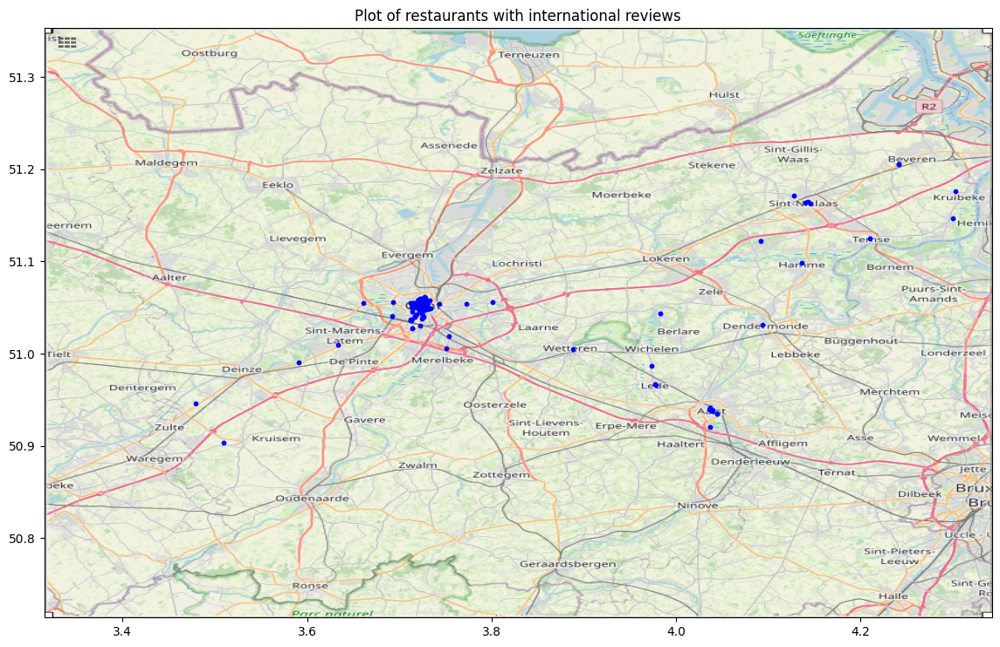

In [54]:

df_reviews_train_merged_coords = df_reviews_train_false.merge(coords, on="id")

Bbox = (3.3151,4.3423,50.7139,51.3529)
map = plt.imread("east_flanders.png")

figure, ax = plt.subplots(figsize = (14,16))

ax.scatter(df_reviews_train_merged_coords.longitude, df_reviews_train_merged_coords.latitude, zorder=1, alpha= 1, c='b',s=10)

ax.set_title('Plot of restaurants with international reviews')
ax.set_xlim(Bbox[0],Bbox[1])
ax.set_ylim(Bbox[2],Bbox[3])

ax.imshow(map, zorder=0, extent=Bbox, aspect='equal')

We can clearly see a cluster of restaurants in Ghent. Popular cities attract more international customers than small local cities.

It's also interesting to see in what kind of cuisine types international people eat the most.

In [55]:
df_reviews_train_false_merged = df_reviews_train_false.merge(df_train, on="id")
df_reviews_train_false_merged["tags"] = df_reviews_train_false_merged["tags"].str.split("|")
df_reviews_train_false_merged = df_reviews_train_false_merged.explode('tags').reset_index(drop=True)
df_reviews_train_false_merged = df_reviews_train_false_merged.groupby("tags").filter(lambda x : str(x).count("$") == 0)
df_reviews_train_false_merged = df_reviews_train_false_merged[["occurences", "tags"]]
df_reviews_train_false_merged = df_reviews_train_false_merged.groupby("tags").sum().sort_values(by=["occurences"], ascending=False)
df_reviews_train_false_merged

,occurences
tags,
Belgian,470
European,373
Vegetarian Friendly,161
Bar,107
Seafood,86
Barbecue,70
French,66
Dutch,65
Cafe,58


It makes sense that when people travel they want to try the local cuisine. That is probably why Belgian cuisine is the most popular.

ideas:
* zoek correlatie tussen rank en een van de rating features
* mss tussen de rating features onderling? dat ze zelfde waarde aangeven en dus overbodig zijn?
* kijk of er clustering is van restaurant prijs en locatie of restaurant prijs en type restaurant. vb er zijn veel meer japanse restaurants in de dure categorie dan japanse restaurants in de goedkope ...
* zie github voor meer

## Loading reviews dataset

In [56]:
import pandas as pd
df = pd.read_csv("./tripadvisor_dataset/reviews.csv")
print("Number of reviews in dataset: ",df.shape[0])
print(df.head(10))
df

Number of reviews in dataset:  136173
         id      reviewer name  \
0  13969825           bertd818   
1  13969825       593laetitiad   
2  13969825           612ellen   
3  13969825             j0ycal   
4  13969825  Global45882037169   
5  13969825        672lindsayv   
6  13969825          Raphael V   
7  13969825           MikeBhdt   
8  13969825            truwant   
9  13969825             SVerst   

                                               title                date  \
0                     supper snelle en lekkere lunch  September 26, 2022   
1     Un délicieux repas aux saveurs de la Thaïlande  September 24, 2022   
2                      Altijd leuk om terug te komen  September 19, 2022   
3  Perfect onthaal/gastvrijheid, superlekker eten...  September 19, 2022   
4                                           genieten  September 19, 2022   
5                                 Vrijgezellen diner  September 18, 2022   
6                                   Super restaurant  S

,id,reviewer name,title,date,rating,review
0,13969825,bertd818,supper snelle en lekkere lunch,"September 26, 2022",5.0,"supper lekker gegeten tijdens de middag, als w..."
1,13969825,593laetitiad,Un délicieux repas aux saveurs de la Thaïlande,"September 24, 2022",5.0,Un menu lunch très bien équilibré aux niveaux ...
2,13969825,612ellen,Altijd leuk om terug te komen,"September 19, 2022",5.0,Super gezellig restaurant met super bediening ...
3,13969825,j0ycal,"Perfect onthaal/gastvrijheid, superlekker eten...","September 19, 2022",5.0,"Perfect onthaal, lekker eten. Heel goede lunch..."
4,13969825,Global45882037169,genieten,"September 19, 2022",5.0,"verrassend lekker gegeten, een mooi en rustig ..."
...,...,...,...,...,...,...
136168,1199541,Geertlieve,Onbeschofte baas,"September 8, 2012",1.0,"Vanavond eens iets gezellig gaan eten, dit was..."
136169,1199541,frans g,Slechtste ervaring ooit!,"June 1, 2012",1.0,Wenst u uiterst onvriendelijk te worden behand...
136170,1199541,fideba,To be avoided at all times,"July 26, 2011",1.0,"This restaurant is a joke. Service was fast, b..."
136171,1199541,Jan D,"fast, friendly and very good food","November 4, 2009",5.0,"The Graaf van Egmo,t is in my opinion one of t..."


## Dogs allowed?
We will look if allowing dogs in the restaurant has a positive outcome. We will use the reviews dataset to analyse the reviews that contain the words "dog", "hond" or "honden". We are not interested in a doggybag option. For this reason we do not search the word "doggies" as it is often used as slang language to refer to a doggybag. 

To avoid including "doggies" and "doggybag" we use a regular expression with word boundaries.

In [57]:
df_nan_dropped = df.dropna()

df_dog = df_nan_dropped[df_nan_dropped['review'].str.contains(r"\b(dog|hond|honden)\b")]
df_dog

C:\Users\xande\AppData\Local\Temp\ipykernel_16596\1690692801.py:3: UserWarning:

This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.



,id,reviewer name,title,date,rating,review
1095,740727,L0laXxx,Hartelijk,"June 12, 2016",5.0,We werden hartelijk ontvangen door de dochter ...
1107,740727,wim_verheyden,"Aangename verrassing, toprestaurantje","November 1, 2015",5.0,Gelegen in het landelijke Liefferinge (Ninove)...
5946,6959268,MissChantal,Mooi pand en vriendelijke bediening,"October 26, 2016",3.0,Heel vriendelijke ontvangst en de bediening is...
6838,740625,corinnew258,Verjaardagsdiner,"June 2, 2018",4.0,Een uitstekend visrestaurant en dit in het bin...
7364,1072090,Sightsee819518,Eens uit eten,"August 20, 2019",5.0,We zijn er al een paar keer geweest en terug a...
...,...,...,...,...,...,...
134294,1179191,nightevune,Poor show,"March 6, 2018",2.0,Me and my partner went here for lunch but was ...
135212,1223250,Marnick V,eten trekt op niks schandalig gewoon,"August 23, 2013",1.0,Kikkerbilletjes volledig verbrand nog te slech...
135283,21311330,Stay521769,Lies,"December 11, 2021",1.0,Walked in sat down @ 4pm to be told that as I ...
135864,13483884,HymerWieMie,Als het goed is mag het ook gezegd !,"September 1, 2019",5.0,Vorig jaar zijn we hier 2 keer komen eten en v...


Now we will take a look at the distribution based on the ranking of the reviews that mention the words that we are looking for. 

In [58]:

print(f"entries:{df_dog.shape[0]}")
df_rating = pd.DataFrame(df_dog.groupby(["rating"])['rating'].count())
df_rating.columns = ["count"]
df_rating['%'] = 100 * df_rating["count"] / df_dog.shape[0]
df_rating

entries:270


,count,%
rating,,
1.0,50,18.518519
2.0,24,8.888889
3.0,34,12.592593
4.0,88,32.592593
5.0,74,27.407407


## Negative reviews
We see the rating and their cumulative and absolute frequency for all the reviews containing the word "dog" (and "hond(en)" in Dutch). Something that stands out is that more then 50% of the reviews that contain the words, are high and positive ratings consisting of a rating of 4.0 or above. The second highest frequency after the positve group spoken earlier, consists of reviews with a rating of 1.0. We will take a look at some of them and see if there are any interesting insights that can be learned from these.


In [70]:
df_dog.loc[df_dog['rating'] == 1.0].values[:5]


array([[877202, 'A5387MQpatrickv', 'Afschuwelijk ', 'January 13, 2019',
        1.0,
        'Je geeft jouw hond nog lekkerder te eten. Ontvangst was wel leuk en enthousiast. Spareribs saai bandnaam en niet lekker mals garnering van het eten as lach wekkend. Nee dit nooit meer'],
       [7987911, 'philipvanremo', 'the rudest experience ever',
        'August 6, 2019', 1.0,
        "If you like dog food and on top being treated like a dog this is the right place for you : never seen waiters like this, very rude and pretending this is funny, I had to calm them down actually, throwing the food on the table, putting a glass of wine in front of a 12 year old, basically endless mistakes and consistent misbehavior.Had a Belgian stew with fries that were so poor you really wonder where to got this from. I'm sure the worst frietkot beats this place quality wise. This is a total disgrace for the city of Ghent."],
       [2365952, 'Crzy_san', 'Arrogante werknemer', 'October 5, 2019',
        1.0,

## Point of views 
when reading, we see that there are multiple 'point of views' that are interesting:
*  people that give a bad review because they are not welcome with their dog
*  people who feel that a dog is not appropriate in a restaurant 
*  people who really did not enjoy their meal and compared it with dog food or even dog faeces. 

To split these remarks in these reviews with a low rating using exploratory data analysis only is not possible. Taking groups of words and analyze their frequency won't work because of the sentence construction. (eg. "Er was ook een klant met een hond. Niet iedereen vindt dit ok."). These insights could be explored deeper later on. We could use sentiment analysis or natural language processing techniques to get a clear split of the "interesting points of vew"

The low ratings can't really be used further, but we could get a lot more out of the positive remarks. When the review mentions a dog and is positive, the chance of the restaurant being dogfriendly and the customer mentioning that the dog was welcome, is high (chance of people that find dogs inappropriate and mensioning not seeing any is relatively low).

We will try to analyse the location of the review by plotting the dog reviews against the coordinates to see in what areas it would reward allowing dogs and where placing dog water bowls would be beneficial. 

In [60]:
df_coo = pd.read_csv("./coordinates.csv").dropna()

# print("coordinates:  ",df_coo.shape[0])
# print(df_coo.head(10))

df_coo["coord"] = df_coo["coord"].str.replace("(","").str.replace(")","").str.replace("\'", "").str.replace("nan","0")
df_coo[["latitude", "longitude"]]  = df_coo["coord"].str.split(",",1, expand=True)

df_coo['latitude'] = pd.to_numeric(df_coo['latitude'])
df_coo['longitude'] = pd.to_numeric(df_coo['longitude'])
df_coo.drop(columns=["coord"],inplace=True)

C:\Users\xande\AppData\Local\Temp\ipykernel_16596\1910305949.py:6: FutureWarning:

The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.



after loading the coordinates and cleaning the data we merge the coordinates dataframe with the reviews dataframe based on id

In [61]:
df_merged = df_coo.merge(df_dog, how="inner", on="id")
df_merged

,id,latitude,longitude,reviewer name,title,date,rating,review
0,740727,50.788705,4.052820,L0laXxx,Hartelijk,"June 12, 2016",5.0,We werden hartelijk ontvangen door de dochter ...
1,740727,50.788705,4.052820,wim_verheyden,"Aangename verrassing, toprestaurantje","November 1, 2015",5.0,Gelegen in het landelijke Liefferinge (Ninove)...
2,6959268,51.169003,4.139171,MissChantal,Mooi pand en vriendelijke bediening,"October 26, 2016",3.0,Heel vriendelijke ontvangst en de bediening is...
3,740625,50.930109,4.041853,corinnew258,Verjaardagsdiner,"June 2, 2018",4.0,Een uitstekend visrestaurant en dit in het bin...
4,1072090,51.054246,3.717377,Sightsee819518,Eens uit eten,"August 20, 2019",5.0,We zijn er al een paar keer geweest en terug a...
...,...,...,...,...,...,...,...,...
265,1223250,50.772471,3.893643,Marnick V,eten trekt op niks schandalig gewoon,"August 23, 2013",1.0,Kikkerbilletjes volledig verbrand nog te slech...
266,21311330,51.054283,3.723116,Stay521769,Lies,"December 11, 2021",1.0,Walked in sat down @ 4pm to be told that as I ...
267,13483884,51.123194,4.216460,HymerWieMie,Als het goed is mag het ook gezegd !,"September 1, 2019",5.0,Vorig jaar zijn we hier 2 keer komen eten en v...
268,1199541,50.938496,4.038905,Anjadegr,Heeeel klantonvriendelijke zaak,"September 27, 2020",1.0,Vandaag meegemaakt : We zaten op terras buiten...


## plotting on a map
 we define a bounding box to plot our geographic data on a map ( the bounding map is defined with the help of openstreetmap.org)

In [62]:
import matplotlib.pyplot as plt
from matplotlib.transforms import Bbox


Bbox = (3.3151,4.3423,50.7139,51.3529)


we read the image map png to plot on

In [63]:
map = plt.imread("east_flanders.png")


Now we can create the plot with the image and the dataset

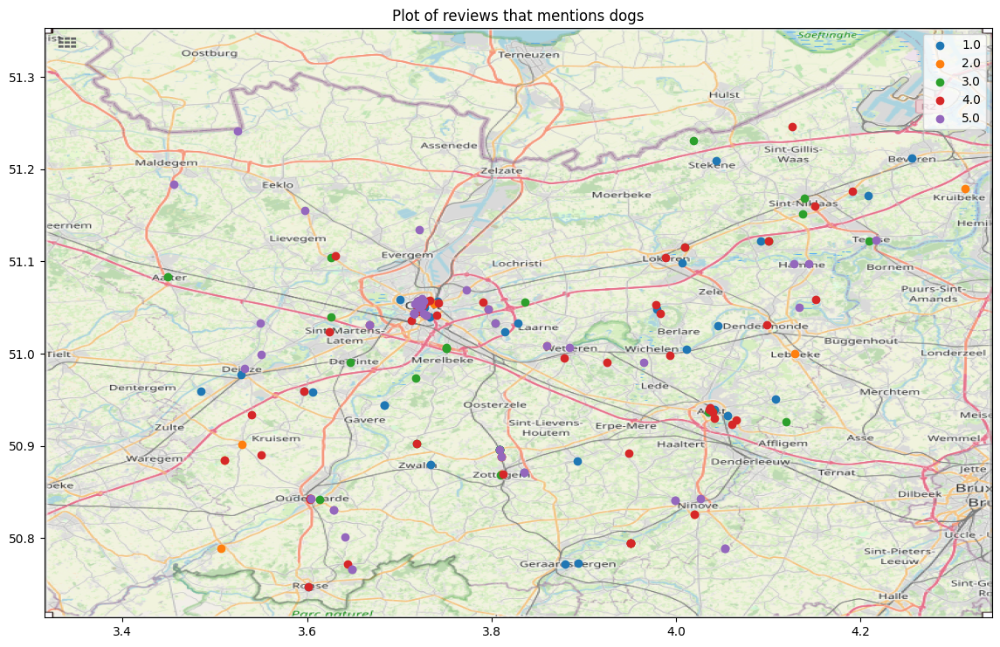

In [64]:
figure, ax = plt.subplots(figsize = (14,16))

groups = df_merged.groupby('rating')
for name, group in groups:
    # ax.scatter(df_merged.longitude, df_merged.latitude, zorder=1, alpha= 1, c=df_merged.rating,s=10)
    ax.scatter(group.longitude, group.latitude, zorder=1, alpha= 1 , label=name)



ax.set_title('Plot of reviews that mentions dogs')
ax.set_xlim(Bbox[0],Bbox[1])
ax.set_ylim(Bbox[2],Bbox[3])
plt.legend()
ax.imshow(map, zorder=0, extent=Bbox, aspect='equal')

## conclusion dog reviews
The plot shows that many of the positive reviews (outside Ghent) are located next to a river. The positive reviews could also mean that there are hiking routes, where dog owners like to come after their walk with the dog. 

In later machine learning steps the remarks discussed in previous sections could help determine if allowing a dog in our restaurant would be beneficial or not.

## feature scaling
In the next task we will quantize the number of reviews of the whole dataset and split them into 5 buckets.

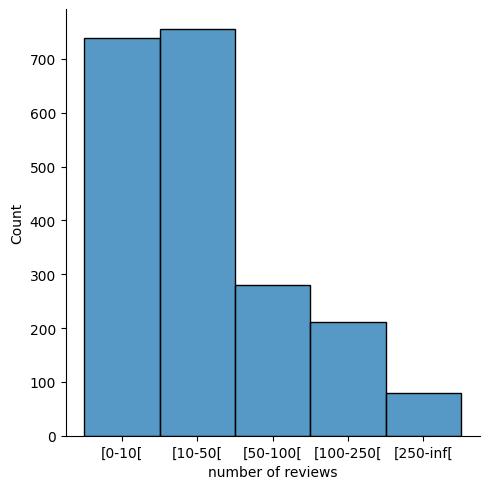

In [65]:
from turtle import right
from sklearn import preprocessing

transformer = preprocessing.FunctionTransformer(pd.cut, kw_args={'bins': [0, 10, 50, 100, 250, np.inf], "right":False, 'labels': ["[0-10[","[10-50[" , "[50-100[", "[100-250[", "[250-inf["], 'retbins': True})
reviews_quantified = transformer.fit_transform(df_train["number of reviews"])
reviews_quantified
sn.displot(reviews_quantified[0])

In the plot you can see that there are a lot of restaurants that have few reviews(0-10) as discussed earlier in the 'hidden treasures' section. The last three buckets together have approximate the same count as the first bucket alone.

## Multi-hot-encoding
Now we will use multi-hot-encoding on the 'special diets' tag.

In [66]:
from sklearn.preprocessing import MultiLabelBinarizer
mlb = MultiLabelBinarizer( sparse_output=False)
ll = df_train["special diets"].fillna('').str.split(",").apply(lambda x: [e.strip() for e in x]).to_list()

diets_encoded = mlb.fit_transform(ll)
print(mlb.classes_)
diets_encoded


['' 'Gluten Free Options' 'Halal' 'Vegan Options' 'Vegetarian Friendly']


array([[1, 0, 0, 0, 0],
       [0, 1, 0, 0, 1],
       [1, 0, 0, 0, 0],
       ...,
       [0, 0, 0, 0, 1],
       [0, 0, 0, 0, 1],
       [0, 1, 0, 1, 1]])

The result is a list of options of multiple classes that are used in the multiclass encoding system. This will be the basis of later machine learning steps where we want to look at the multi label problem "special diets" and classify the results into multiple classes.

## Missing data

let's see how we can fix our missing data problem

In [68]:
df_train.replace(-1,np.nan).isna().sum()

rank                    166
restaurant name           0
general rating          164
number of reviews         0
tags                    162
address                   0
phone number            164
website url             324
menu url               1324
timetable                 0
email address          1000
travelers choice          0
michelin                  0
value rating            821
atmosphere rating      1666
description            1647
dutch description      1829
cuisines                262
special diets          1367
meals                   473
restaurant features     617
id                        0
city                      0
lower_price            1527
upper_price            1527
dtype: int64

We can't really drop rows with the missing values because it's a big part of our data that we would waste.
* for the rank we already know that it depends on your reviews and your location so maybe we can look at similar restaurants in the same city with the same number of reviews and the same cuisine
* gelijkaardig voor general rating, value rating,atmosphere rating
* description kunnen we mss uit de reviews halen
* cuisines uit de tags?


In [69]:
def findRank(row):
    #first get all restaurants that have the same city
    #then drop out those that don't have the same amount of reviews
    #then drop out those that don't have the same general_rating or service rating
    #then drop those that have a different quisine
    #then from those that are left, calculate the average rank 

SyntaxError: incomplete input (3614292800.py, line 6)

ideas:
* zoek correlatie tussen rank en een van de rating features
* mss tussen de rating features onderling? dat ze zelfde waarde aangeven en dus overbodig zijn?
* kijk of er clustering is van restaurant prijs en locatie of restaurant prijs en type restaurant. vb er zijn veel meer japanse restaurants in de dure categorie dan japanse restaurants in de goedkope ...
* zie github voor meer